In [5]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_iris


In [6]:
#reading a file and adding column names to it.
names=['age','workclass','fnlwgt','education','education_num','marital_status','occupation','relationship','race','sex','capial_gain','capital_loss','hours_per_week','native_country','salary']
data = pd.read_csv('adult.csv',header=None,names=names)
data.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capial_gain,capital_loss,hours_per_week,native_country,salary
0,39,State-gov,77516.0,Bachelors,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,<=50K
1,50,Self-emp-not-inc,83311.0,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States,<=50K
2,38,Private,215646.0,HS-grad,9.0,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K
3,53,Private,234721.0,11th,7.0,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K
4,28,Private,338409.0,Bachelors,13.0,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K


In [7]:
data = data.replace('?',np.NaN)
data = data.dropna()
data.isnull().sum()

age               0
workclass         0
fnlwgt            0
education         0
education_num     0
marital_status    0
occupation        0
relationship      0
race              0
sex               0
capial_gain       0
capital_loss      0
hours_per_week    0
native_country    0
salary            0
dtype: int64

In [8]:
#converting all the categorical features into numeric features
data["workclass"] = data["workclass"].astype('category')
data.workclass = data.workclass.cat.codes
data.marital_status = data.marital_status.astype('category').cat.codes
data.race = data.race.astype('category').cat.codes
data.relationship = data.relationship.astype('category').cat.codes
data.occupation = data.occupation.astype('category').cat.codes
data.native_country = data.native_country.astype('category').cat.codes
data.sex = data.sex.astype('category').cat.codes
data.salary = data.salary.astype('category').cat.codes

data.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capial_gain,capital_loss,hours_per_week,native_country,salary
0,39,7,77516.0,Bachelors,13.0,4,1,1,4,1,2174.0,0.0,40.0,38,0
1,50,6,83311.0,Bachelors,13.0,2,4,0,4,1,0.0,0.0,13.0,38,0
2,38,4,215646.0,HS-grad,9.0,0,6,1,4,1,0.0,0.0,40.0,38,0
3,53,4,234721.0,11th,7.0,2,6,0,2,1,0.0,0.0,40.0,38,0
4,28,4,338409.0,Bachelors,13.0,2,10,5,2,0,0.0,0.0,40.0,5,0


In [9]:
#creating X and y
X = data.drop(['salary','education'],axis = 1)
y = data.salary

In [10]:
#Splitting dataset into train and test 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

 # Classification using Decision Tree

In [11]:
from sklearn.tree import DecisionTreeClassifier

# Make a decision tree and train
tree = DecisionTreeClassifier(random_state=50)
tree.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=50,
            splitter='best')

In [12]:
print(f'Model Accuracy: {tree.score(X_test, y_test)}')

Model Accuracy: 0.8035509736540665


## Visualizing Tree

In [13]:
from sklearn.tree import export_graphviz
export_graphviz(tree, out_file='tree.dot', 
                feature_names = X.columns,
                class_names = ['True','false'],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

In [14]:
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

0

In [15]:
from IPython.display import Image
Image(filename = 'tree.png')

## ROCAUC Curve

In [16]:
def prediction(model,train,test):
    # Training predictions (to demonstrate overfitting)
    train_rf_predictions = model.predict(train)
    train_rf_probs = model.predict_proba(train)[:, 1]

    # Testing predictions (to determine performance)
    rf_predictions = model.predict(test)
    rf_probs = model.predict_proba(test)[:, 1]
    
    return rf_predictions, rf_probs, train_rf_predictions, train_rf_probs

In [17]:
def evaluate_model(predictions, probs, train_predictions, train_probs):
    """Compare machine learning model to baseline performance.
    Computes statistics and shows ROC curve."""
    
    baseline = {}
    
    baseline['recall'] = recall_score(y_test, 
                                     [1 for _ in range(len(y_test))])
    baseline['precision'] = precision_score(y_test, 
                                      [1 for _ in range(len(y_test))])
    baseline['roc'] = 0.5
    
    results = {}
    
    results['recall'] = recall_score(y_test, predictions)
    results['precision'] = precision_score(y_test, predictions)
    results['roc'] = roc_auc_score(y_test, probs)
    
    train_results = {}
    train_results['recall'] = recall_score(y_train, train_predictions)
    train_results['precision'] = precision_score(y_train, train_predictions)
    train_results['roc'] = roc_auc_score(y_train, train_probs)
    
    for metric in ['recall', 'precision', 'roc']:
        print(f'{metric.capitalize()} Baseline: {round(baseline[metric], 2)} Test: {round(results[metric], 2)} Train: {round(train_results[metric], 2)}')
    
    # Calculate false positive rates and true positive rates
    base_fpr, base_tpr, _ = roc_curve(y_test, [1 for _ in range(len(y_test))])
    model_fpr, model_tpr, _ = roc_curve(y_test, probs)

    plt.figure(figsize = (8, 6))
    plt.rcParams['font.size'] = 16
    
    # Plot both curves
    plt.plot(base_fpr, base_tpr, 'b', label = 'baseline')
    plt.plot(model_fpr, model_tpr, 'r', label = 'model')
    plt.legend();
    plt.xlabel('False Positive Rate'); 
    plt.ylabel('True Positive Rate'); plt.title('ROC Curves');
    plt.show();


In [18]:
evaluate_model(*prediction(tree, X_train,X_test))
plt.savefig('roc_auc_curve.png')

NameError: name 'recall_score' is not defined

In [19]:
# Get numerical feature importances
importances = list(tree.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(X.columns, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: fnlwgt               Importance: 0.2
Variable: relationship         Importance: 0.2
Variable: age                  Importance: 0.13
Variable: education_num        Importance: 0.12
Variable: capial_gain          Importance: 0.11
Variable: hours_per_week       Importance: 0.07
Variable: occupation           Importance: 0.06
Variable: capital_loss         Importance: 0.04
Variable: workclass            Importance: 0.03
Variable: marital_status       Importance: 0.01
Variable: race                 Importance: 0.01
Variable: native_country       Importance: 0.01
Variable: sex                  Importance: 0.0


# Classification using Random Forest


In [20]:
from sklearn.ensemble import RandomForestClassifier

# Create the model with 100 trees
model = RandomForestClassifier(n_estimators=100, 
                               bootstrap = True,
                               max_features = 'sqrt',max_depth = 5)
# Fit on training data
model.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=5, max_features='sqrt', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [21]:
model.score(X_test,y_test)

0.8512791141657121

In [22]:
estimators = model.estimators_[5]

In [104]:
export_graphviz(estimators, out_file='random.dot', 
                feature_names = X.columns,
                class_names = ['True','false'],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

In [105]:
from subprocess import call
call(['dot', '-Tpng', 'random.dot', '-o', 'random.png', '-Gdpi=600'])

0

In [106]:
from IPython.display import Image
Image(filename = 'random.png')

In [72]:

from sklearn.metrics import precision_score, recall_score, roc_auc_score, roc_curve
import matplotlib.pyplot as plt

In [73]:
plt.style.use('fivethirtyeight')
plt.rcParams['font.size'] = 18

Recall Baseline: 1.0 Test: 0.48 Train: 0.48
Precision Baseline: 0.25 Test: 0.82 Train: 0.82
Roc Baseline: 0.5 Test: 0.9 Train: 0.9


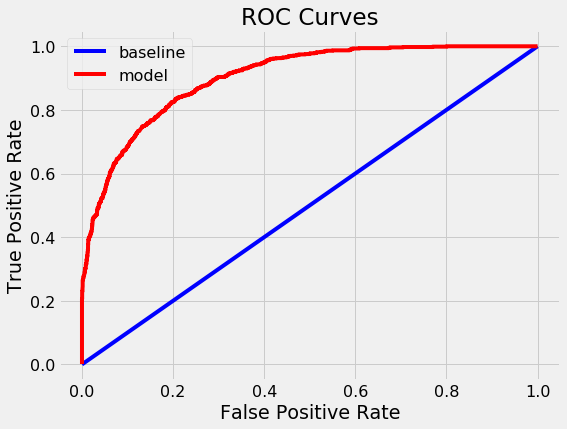

<Figure size 3600x720 with 0 Axes>

In [159]:
evaluate_model(*prediction(model,X_train,X_test))
plt.savefig('roc_auc_curve.png')

In [88]:
# Get numerical feature importances
importances = list(model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(X.columns, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: fnlwgt               Importance: 0.16
Variable: age                  Importance: 0.15
Variable: education_num        Importance: 0.13
Variable: capial_gain          Importance: 0.12
Variable: relationship         Importance: 0.11
Variable: hours_per_week       Importance: 0.08
Variable: occupation           Importance: 0.07
Variable: marital_status       Importance: 0.05
Variable: workclass            Importance: 0.04
Variable: capital_loss         Importance: 0.04
Variable: race                 Importance: 0.02
Variable: native_country       Importance: 0.02
Variable: sex                  Importance: 0.01


# Xgboost

In [23]:
import xgboost as xgb

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)


In [25]:
xg_reg = xgb.XGBClassifier(objective ='reg:logistic', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 10)

In [26]:
xg_reg.fit(X_train,y_train)


XGBClassifier(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.3, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=5, min_child_weight=1, missing=None, n_estimators=10,
       n_jobs=1, nthread=None, objective='reg:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1)

In [27]:
xg_reg.score(X_test, y_test)

/home/romil/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


0.8347651775486827

In [28]:
# Training predictions (to demonstrate overfitting)
train_rf_predictions = xg_reg.predict(X_train)
train_rf_probs = xg_reg.predict_proba(X_train)[:, 1]

# Testing predictions (to determine performance)
rf_predictions = xg_reg.predict(X_test)
rf_probs = xg_reg.predict_proba(X_test)[:, 1]

/home/romil/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/romil/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


In [29]:
evaluate_model(*prediction(xg_reg,X_train, X_test))
plt.savefig('roc_auc_curve.png')

/home/romil/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/home/romil/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


NameError: name 'recall_score' is not defined

### visualizing tree


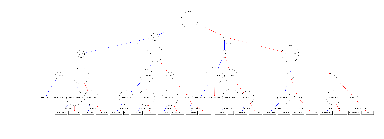

In [30]:
xgb.plot_tree(xg_reg,num_trees=0)
plt.rcParams['figure.figsize'] = [50, 10]
plt.savefig('xg_boost.png')
plt.show()

## k-fold Cross Validation using XGBoost


In [149]:
data_dmatrix = xgb.DMatrix(data=X,label=y)

In [150]:
params = {"objective":"reg:linear",'colsample_bytree': 0.3,'learning_rate': 0.1,
                'max_depth': 5, 'alpha': 10}

In [151]:
cv_results = xgb.cv(dtrain=data_dmatrix, params=params, nfold=3,
                    num_boost_round=50,early_stopping_rounds=10,metrics='rmse', as_pandas=True, seed=123)

[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /work

[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 12 extra nodes, 0 pruned nodes, max_depth=4
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 16 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /work

[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=5
[14:45:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 0 pruned nodes, max_depth=5


In [168]:
cv_results.head()

,train-rmse-mean,train-rmse-std,test-rmse-mean,test-rmse-std
0,0.479649,0.000233,0.479846,0.000200
1,0.461469,0.003157,0.461783,0.002871
2,0.443636,0.001932,0.444081,0.001529
3,0.429006,0.003592,0.429739,0.002855
4,0.416179,0.004954,0.417101,0.003602


In [170]:
#final boosing round metric
print((cv_results["test-rmse-mean"]).tail(1))

49    0.319569
Name: test-rmse-mean, dtype: float64


## Feature importance

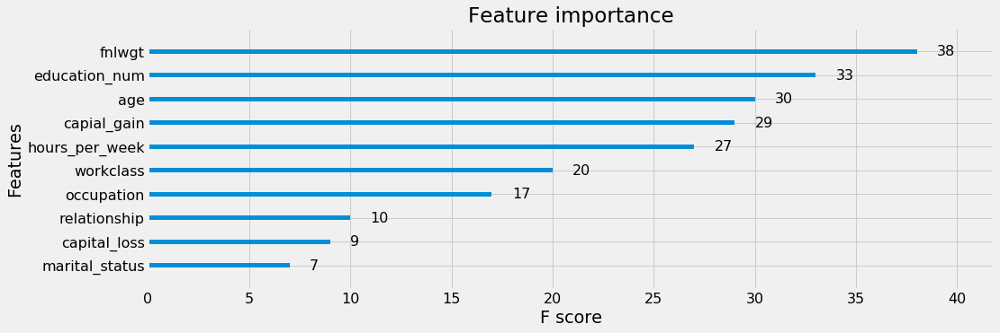

In [167]:
xgb.plot_importance(xg_reg)
plt.rcParams['figure.figsize'] = [15,15]
plt.show()